## This code is to visualize the directional tuning of a head direction cell

In [1]:
import numpy as np
from scipy.ndimage import convolve1d
import matplotlib.pyplot as plt
import os
import utils

%load_ext autoreload
%autoreload 2


In [2]:
def plot_head_direction_tuning(ax, angle_data, angle4spike, config, pos_tb=0.01):
    """
    Plot the head direction tuning map in a polar plot.

    Parameters:
    ax : matplotlib.axes._subplots.PolarAxesSubplot
        The polar axes to plot on.
    ppoh : np.array
        Array of session head direction angles in degrees.
    psph : np.array
        Array of cell head direction angles in degrees.
    pos_tb : float
        Time base for converting session HD to time.
    cell_name : str
        Name of the cell for which the tuning map is plotted.
    config : dict
        Configuration dictionary containing 'hd_bins' and 'hd_boxcar' parameters.
    """


    # Calculate histograms for session and cell head directions
    hd1, _ = np.histogram(angle_data, bins=config['hd_bins'], range=(-np.pi, np.pi))
    hd2, _ = np.histogram(angle4spike, bins=config['hd_bins'], range=(-np.pi, np.pi))

    # Boxcar filter
    boxcar_size = config['hd_boxcar']
    boxcar_filter = np.ones(boxcar_size) / boxcar_size

    # Apply boxcar filter
    hd1_filtered = convolve1d(hd1, boxcar_filter, mode='wrap')
    hd2_filtered = convolve1d(hd2, boxcar_filter, mode='wrap')

    # Convert session HD to time (i.e., dwelling time in each HD bin)
    hd1_time = hd1_filtered * pos_tb

    # Calculate HD firing rate
    hd3 = hd2_filtered / hd1_time
    # #where hd3 is nan, set it to 0
    # hd3 = np.nan_to_num(hd3)
    
    # Normalize session HD
    hd1_normalized = hd1_time / np.max(hd1_time)

    # Normalize cell HD firing rate
    hd3_normalized = hd3 / np.nanmax(hd3)
    hd3_normalized = hd3_normalized.flatten()

    # Close the loop by appending the first element to the end
    theta = np.linspace(-np.pi, np.pi, config['hd_bins'], endpoint=False)
    theta = np.append(theta, theta[0])
    hd1_normalized = np.append(hd1_normalized, hd1_normalized[0])
    hd3_normalized = np.append(hd3_normalized, hd3_normalized[0])

    # Plot the session head direction with shading
    ax.plot(theta, hd1_normalized, label='Session Head Direction', color='gray')
    ax.fill_between(theta, 0, hd1_normalized, facecolor='gray', alpha=0.2)

    # Plot the cell head direction firing rate
    ax.plot(theta, hd3_normalized, label='Cell Head Direction Firing Rate', color='#38c7ff')
    ax.fill_between(theta, 0, hd3_normalized, facecolor='#38c7ff', alpha=0.5)

    #keep 0 90 180 270 as the xticks
    ax.set_xticks([0, np.pi / 2, np.pi, 3 * np.pi / 2])
    ax.set_xticklabels(['0', '90', '180', '270'])
    
    #remove yticks
    ax.set_yticks([])
    
    #calculate the preferred direction which corresponds to the peak of the tuning curve
    hd_peakfr = theta[np.argmax(hd3_normalized)] 
    #add a line to indicate the preferred direction
    ax.plot([hd_peakfr, hd_peakfr], [0, 1], color='red', linestyle='--', linewidth=1)
    
    return ax

### check one cell example

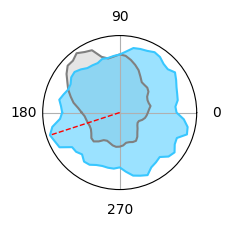

In [31]:
mousetrial = '/home/zilong/Desktop/HDPhasePrecession/DuszkiewiczData/Dataset_5/A1104-180328/Data'

#load data
data = utils.load_data(mousetrial)

t = data['t']
angle_data = data['angle_data']

adn = data['adn']
hd = data['hd']

idx = np.where(adn == 1)[0]

spike_times = data['spike_times']

spike_times = [spike_times[i] for i in idx]

# Configuration
config = {
    'hd_bins': 60,
    'hd_boxcar': 3,
}

#angle4spike
spike_time_cell_i = spike_times[0]
spike_array_cell_i = utils.compute_spike_array(spike_time_cell_i, t)

#calculate the head direction angle when spike_array_cell_i is not zero
angle4spike = angle_data[spike_array_cell_i != 0]

fig = plt.figure(figsize=(2,2))

ax = fig.add_subplot(111, polar=True)

ax = plot_head_direction_tuning(ax, angle_data, angle4spike, config)



### plot all cells

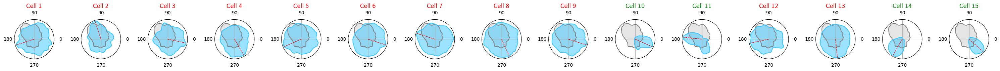

In [32]:
fig = plt.figure(figsize=(2*len(spike_times),2))

for i in range(len(spike_times)):
    spike_time_cell_i = spike_times[i]
    spike_array_cell_i = utils.compute_spike_array(spike_time_cell_i, t)

    #calculate the head direction angle when spike_array_cell_i is not zero
    angle4spike = angle_data[spike_array_cell_i != 0]

    ax = fig.add_subplot(1,len(spike_times),i+1, polar=True)
    ax = plot_head_direction_tuning(ax, angle_data, angle4spike, config)
    
    #add title as cell index if hd[i] is 1, color as green, otherwise as red
    ax.set_title('Cell ' + str(i+1), color='green' if hd[idx[i]] == 1 else 'red')

plt.tight_layout()


### loop over all files and plot the directional tuning of each cell

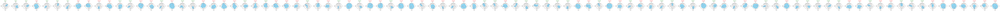

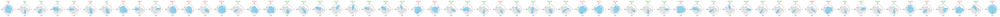

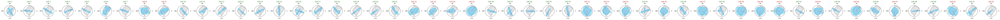

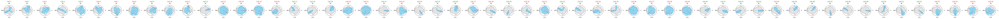

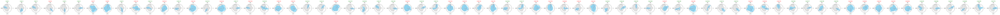

...

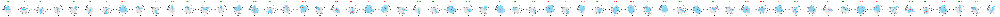

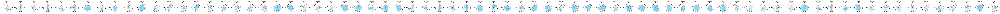

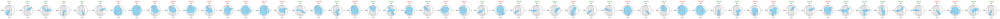

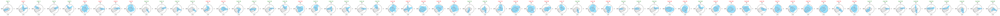

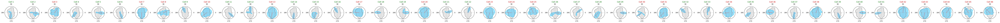

In [5]:
# all folders in /home/zilong/Desktop/HDPhasePrecession/DuszkiewiczData/Dataset_5
dataset = 'Dataset_1'
folders = os.listdir('/home/zilong/Desktop/HDPhasePrecession/DuszkiewiczData/' + dataset)

for folder in folders:
    mousetrial = '/home/zilong/Desktop/HDPhasePrecession/DuszkiewiczData/' + dataset + '/' + folder + '/Data'
    
    
    #load data
    data = utils.load_data(mousetrial)
    t = data['t']
    angle_data = data['angle_data']
    adn = data['pos'] #adn = data['pos']
    hd = data['hd']
    idx = np.where(adn == 1)[0]
    spike_times = data['spike_times']
    spike_times = [spike_times[i] for i in idx]
    
    # Configuration
    config = {
        'hd_bins': 60,
        'hd_boxcar': 3,
    }
    
    #plot all directional tuning
    fig = plt.figure(figsize=(2*len(spike_times),2))
    for i in range(len(spike_times)):
        spike_time_cell_i = spike_times[i]
        spike_array_cell_i = utils.compute_spike_array(spike_time_cell_i, t)

        #calculate the head direction angle when spike_array_cell_i is not zero
        angle4spike = angle_data[spike_array_cell_i != 0]

        ax = fig.add_subplot(1,len(spike_times),i+1, polar=True)
        ax = plot_head_direction_tuning(ax, angle_data, angle4spike, config)

        #add title as cell index if hd[i] is 1, color as green, otherwise as red
        ax.set_title('Cell ' + str(i+1), color='green' if hd[idx[i]] == 1 else 'red')
    
    plt.tight_layout()
    #save the figure to /home/zilong/Desktop/HDPhasePrecession/figures/ADN_HD_tuning
    savefolder = '/home/zilong/Desktop/HDPhasePrecession/figures/HD_tuning/' + dataset
    if not os.path.exists(savefolder):
        os.makedirs(savefolder)
    plt.savefig(savefolder + '/' + folder + '.png')
    # #close the figure
    # plt.close()